In [1]:
# Libraries required
import pandas as pd
import os
import matplotlib.pyplot as plt
import numpy as np
import scipy
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.ar_model import AutoReg
from math import sqrt
import datetime

In [2]:
# Change path to the files
pwd = 'TGA/'
os.chdir(pwd)

# Concat DataFrame and clean data

In [3]:
#read in the files
dfff = pd.DataFrame(columns  = [
                        'Time_in_mins'])
for xx in range(1,11):
    #change the file name at 10
    ns = 'I0'
    if xx == 10:
        ns = 'I'
    for y in range(1,5):
        for z in range(0,10):
            #check if path existed
            if os.path.exists(ns+str(xx)+'R'+str(y)+'V'+str(z)+'.CSV'):
                # Read the csv files and naming its columns
                df = pd.read_csv(ns+str(xx)+'R'+str(y)+'V'+str(z)+'.CSV', 
                     names=
                        ['Day_of_Year',
                        'UTC_Hours',
                        'UTC_Minutes',
                        'UTC_seconds',
                        'IOP_number',
                        'van_number',
                        'pass_number',
                        'hours_in_CDT_day_start',
                        'latitude',
                        'longitude', 
                        'altitude',
                        'number_of_satellites',
                        'hdop',
                        'concentration_of_SF6',
                        'QC_flag'])
                # generate release Dataframe dff based on the first csv
                if z == 0:
                    vn = 'concentration_van'+str(z)
                    df[vn] = df['concentration_of_SF6']+999
                    k = df['hours_in_CDT_day_start'][0]
                    df['Time_in_mins'] = df['hours_in_CDT_day_start'].apply(lambda x: (x-k)*60)
                    dff = df[['Day_of_Year','UTC_Hours','UTC_Minutes','UTC_seconds','Time_in_mins',vn]]
                # eliminate the moving van data   
                elif z == 5:
                        continue
                # generate a new column and concat it to dff
                else:
                    vn = 'concentration_van'+str(z)
                    df[vn] = df['concentration_of_SF6']+999
                    df = pd.DataFrame(df[vn])
                    dff = pd.concat([dff,df], axis = 1)
            # if path not exist, continue       
            else:
                continue
        dfff = pd.concat([dfff,dff])
dfff.head()

,Time_in_mins,Day_of_Year,UTC_Hours,UTC_Minutes,UTC_seconds,concentration_van0,concentration_van1,concentration_van2,concentration_van3,concentration_van4,concentration_van6,concentration_van7,concentration_van8,concentration_van9
0,0.000000,180.0,14.0,0.0,0.0,0.0,0.0,0.0,0.0,1030.6,0.0,0.0,0.0,0.0
1,0.008334,180.0,14.0,0.0,0.5,0.0,0.0,0.0,0.0,1030.5,0.0,0.0,0.0,0.0
2,0.016668,180.0,14.0,0.0,1.0,0.0,0.0,0.0,0.0,1033.7,0.0,0.0,0.0,0.0
3,0.025002,180.0,14.0,0.0,1.5,0.0,0.0,0.0,0.0,1033.7,0.0,0.0,0.0,0.0
4,0.033336,180.0,14.0,0.0,2.0,0.0,0.0,0.0,0.0,1024.9,0.0,0.0,0.0,0.0


# Print individual lines with MA

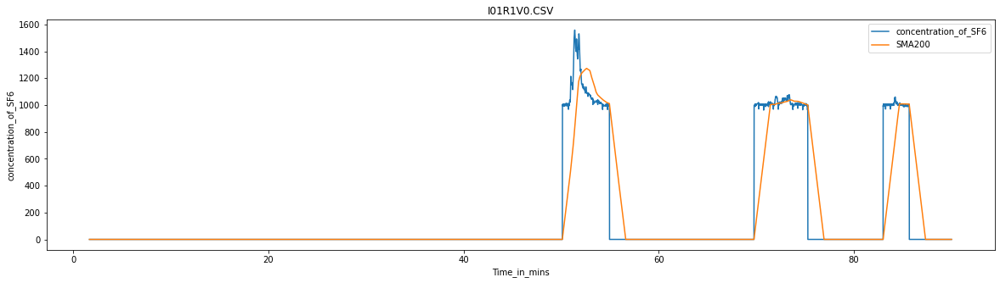

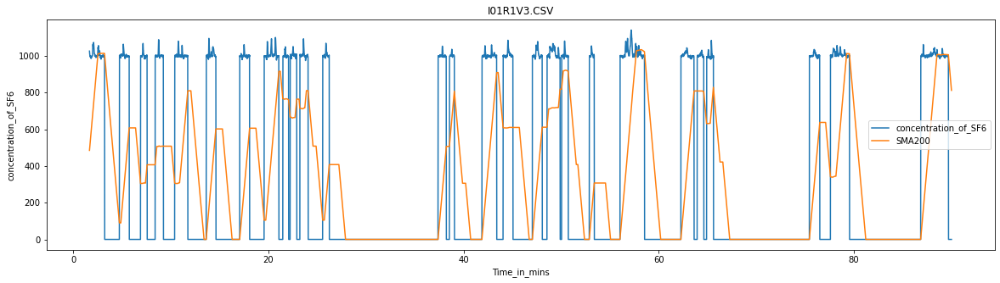

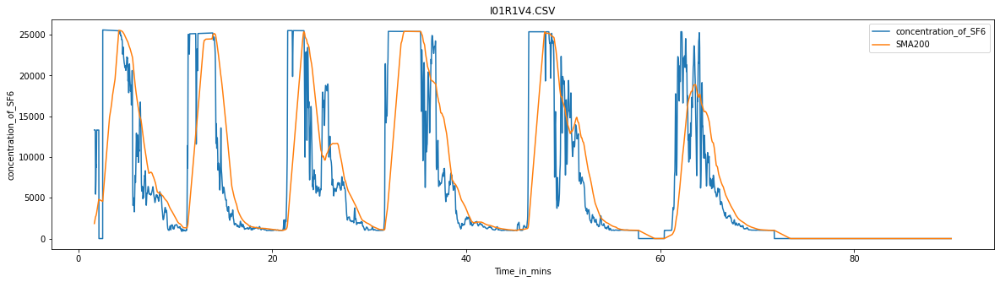

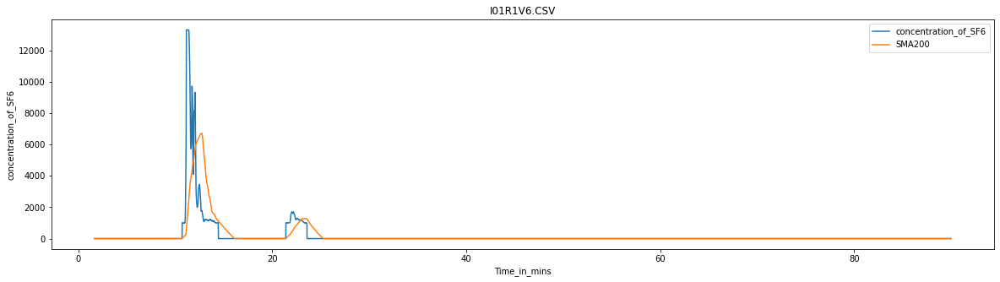

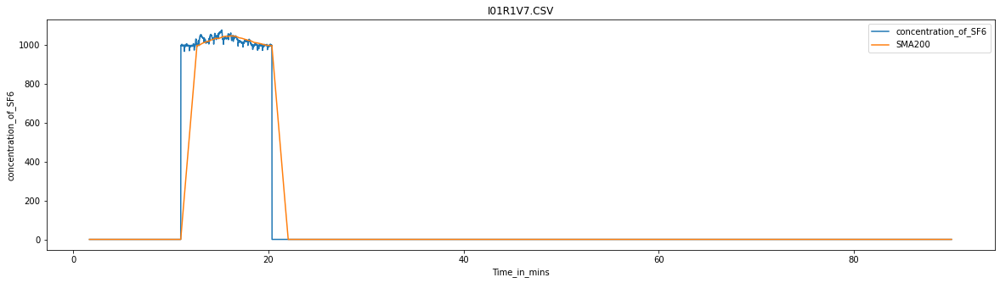

...

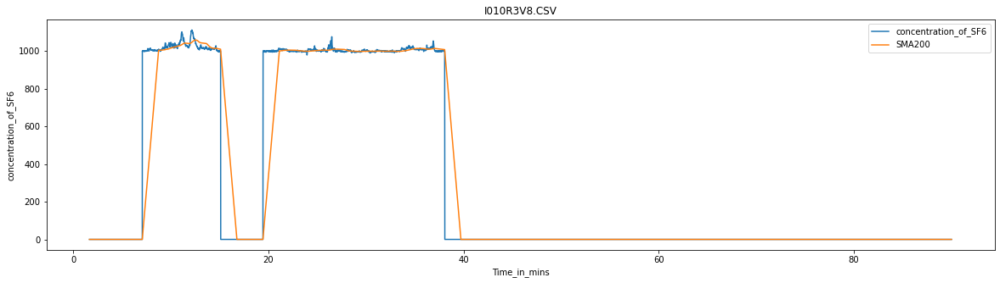

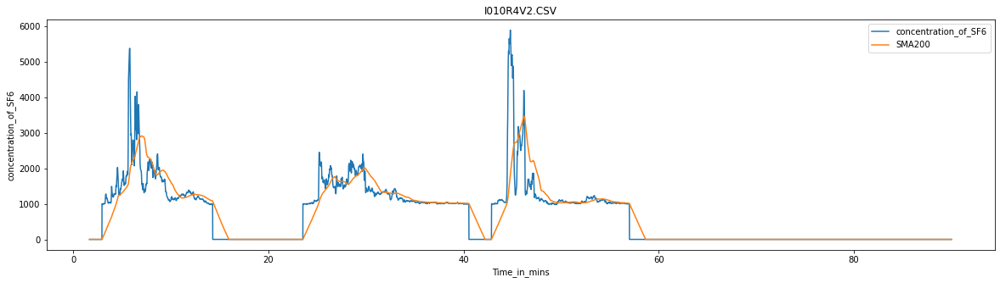

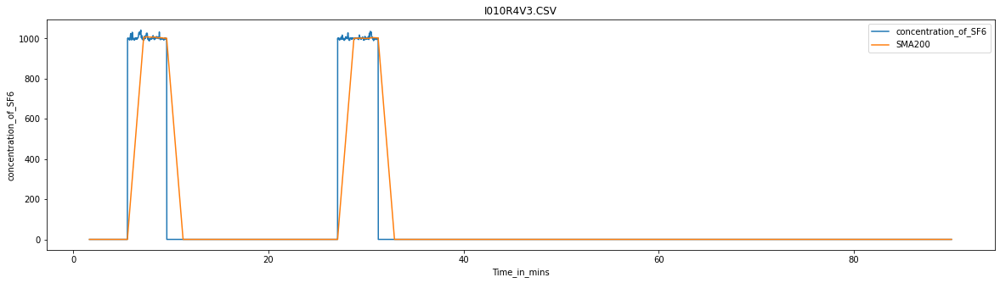

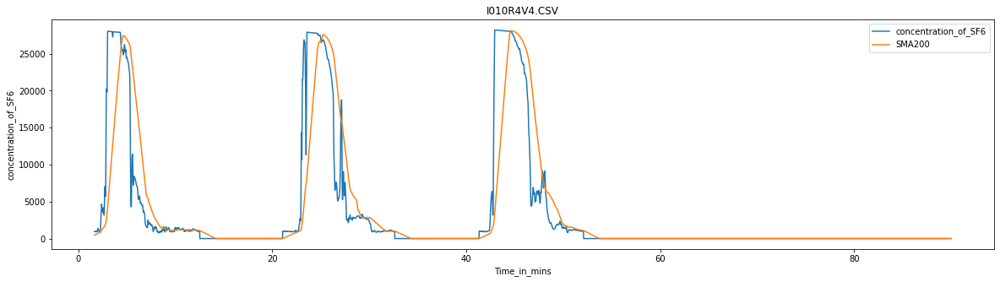

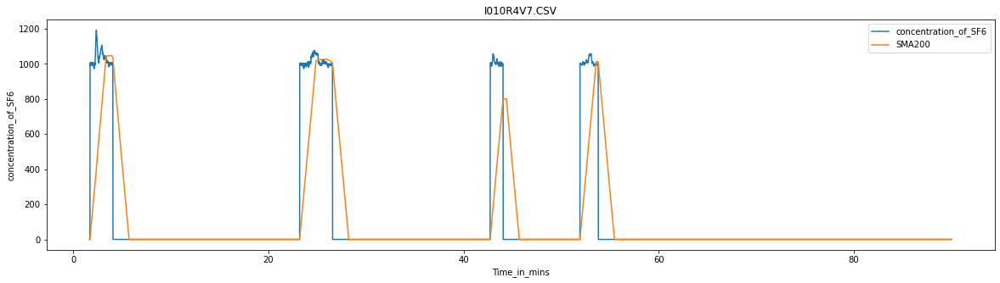

In [4]:
#read in the files
for xx in range(1,11):
    #change the file name at 10
    ns = 'I0'
    if xx == 10:
        ns = 'I'
    for y in range(1,5):
        for z in range(0,10):
            #check if path existed
            if os.path.exists(ns+str(xx)+'R'+str(y)+'V'+str(z)+'.CSV'):
                # Read the csv files and naming its columns
                df = pd.read_csv(ns+str(xx)+'R'+str(y)+'V'+str(z)+'.CSV', 
                     names=
                        ['Day_of_Year',
                        'UTC_Hours',
                        'UTC_Minutes',
                        'UTC_seconds',
                        'IOP_number',
                        'van_number',
                        'pass_number',
                        'hours_in_CDT_day_start',
                        'latitude',
                        'longitude', 
                        'altitude',
                        'number_of_satellites',
                        'hdop',
                        'concentration_of_SF6',
                        'QC_flag'])
                # generate release Dataframe dff based on the first csv
                # generate a new columns that record the experiment in mins    

                # eliminate the moving van data   
                if z == 5:
                        continue
                # generate a new column and concat it to dff
                else:
                    k = df['hours_in_CDT_day_start'][0]
                    df['Time_in_mins'] = df['hours_in_CDT_day_start'].apply(lambda x: (x-k)*60)
                    df['cleaned_concertration'] = df['concentration_of_SF6'].apply(lambda x: x+999)
                    
                    if (df['cleaned_concertration']==0).all():
                        continue
                
                    # see if gps position change: if latitude, longitude, altitude stays the same
                    la = (df['latitude']==df['latitude'][0]).all()
                    lo = (df['longitude']==df['longitude'][0]).all()
                    al = (df['altitude']==df['altitude'][0]).all()
                    if la and lo and al == False:
                        continue
                        
                    else:
                        # clean the concentration_of_SF6 data and create a new dataframe to be plot
                        df1 = df[['cleaned_concertration','Time_in_mins']].copy()

                        # calculate the moving averge with a with of 200
                        df1['SMA200'] = df1['cleaned_concertration'].rolling(200).mean()
                        df1.dropna(inplace = True)

                        # plot the graph
                        plt.figure(figsize=(20,5))
                        plt.plot(df1['Time_in_mins'],df1['cleaned_concertration'],label = 'concentration_of_SF6')
                        plt.plot(df1['Time_in_mins'],df1['SMA200'],label = 'SMA200')

                        # label the graph
                        plt.xlabel('Time_in_mins')
                        plt.ylabel('concentration_of_SF6')
                        plt.legend()
                        plt.title('I0'+str(xx)+'R'+str(y)+'V'+str(z)+'.CSV')
                    plt.show()
            # if path not exist, continue       
            else:
                continue
        
        

# Focus on I01R1V4 data

In [6]:
v4data = pd.read_csv('I01R1V4.csv', 
                     names=
                        ['Day_of_Year',
                        'UTC_Hours',
                        'UTC_Minutes',
                        'UTC_seconds',
                        'IOP_number',
                        'van_number',
                        'pass_number',
                        'hours_in_CDT_day_start',
                        'latitude',
                        'longitude', 
                        'altitude',
                        'number_of_satellites',
                        'hdop',
                        'concentration_of_SF6',
                        'QC_flag'])
v4data.head()

,Day_of_Year,UTC_Hours,UTC_Minutes,UTC_seconds,IOP_number,van_number,pass_number,hours_in_CDT_day_start,latitude,longitude,altitude,number_of_satellites,hdop,concentration_of_SF6,QC_flag
0,180,14,0,0.0,1,4,-1,9.000000,35.468405,-97.514135,-999,-1,0.0,31.6,1
1,180,14,0,0.5,1,4,-1,9.000139,35.468405,-97.514135,-999,-1,0.0,31.5,1
2,180,14,0,1.0,1,4,-1,9.000278,35.468405,-97.514135,-999,-1,0.0,34.7,1
3,180,14,0,1.5,1,4,-1,9.000417,35.468405,-97.514135,-999,-1,0.0,34.7,1
4,180,14,0,2.0,1,4,-1,9.000556,35.468405,-97.514135,-999,-1,0.0,25.9,1


In [7]:
# see if gps position change: if latitude, longitude, altitude stays the same
la = (v4data['latitude']==v4data['latitude'][0]).all()
lo = (v4data['longitude']==v4data['longitude'][0]).all()
al = (v4data['altitude']==v4data['altitude'][0]).all()
if la and lo and al == True:
    print('Gps position not changed')
else:
    print('Gps position has changed')

Gps position not changed


In [8]:
import datetime
dt = datetime.datetime(2012,2,12)
v4data = v4data.assign(datetime = lambda x: 20020601*1000000+x['UTC_Hours']*10000+x['UTC_Minutes']*100+x['UTC_seconds'])
v4data['datetime'] = pd.to_datetime(v4data['datetime'], format='%Y%m%d%H%M%S')
final_v4data = v4data.drop(['Day_of_Year','UTC_Hours','UTC_Minutes','UTC_seconds'], axis = 1)
first_column = final_v4data.pop('datetime')
final_v4data.insert(0, 'datetime', first_column)
final_v4data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10801 entries, 0 to 10800
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   datetime                10801 non-null  datetime64[ns]
 1   IOP_number              10801 non-null  int64         
 2   van_number              10801 non-null  int64         
 3   pass_number             10801 non-null  int64         
 4   hours_in_CDT_day_start  10801 non-null  float64       
 5   latitude                10801 non-null  float64       
 6   longitude               10801 non-null  float64       
 7   altitude                10801 non-null  int64         
 8   number_of_satellites    10801 non-null  int64         
 9   hdop                    10801 non-null  float64       
 10  concentration_of_SF6    10801 non-null  float64       
 11  QC_flag                 10801 non-null  int64         
dtypes: datetime64[ns](1), float64(5), int64(6)
mem

In [9]:
final_v4data

,datetime,IOP_number,van_number,pass_number,hours_in_CDT_day_start,latitude,longitude,altitude,number_of_satellites,hdop,concentration_of_SF6,QC_flag
0,2002-06-01 14:00:00,1,4,-1,9.000000,35.468405,-97.514135,-999,-1,0.0,31.6,1
1,2002-06-01 14:00:00,1,4,-1,9.000139,35.468405,-97.514135,-999,-1,0.0,31.5,1
2,2002-06-01 14:00:01,1,4,-1,9.000278,35.468405,-97.514135,-999,-1,0.0,34.7,1
3,2002-06-01 14:00:01,1,4,-1,9.000417,35.468405,-97.514135,-999,-1,0.0,34.7,1
4,2002-06-01 14:00:02,1,4,-1,9.000556,35.468405,-97.514135,-999,-1,0.0,25.9,1
...,...,...,...,...,...,...,...,...,...,...,...,...
10796,2002-06-01 15:29:58,1,4,-1,10.499444,35.468405,-97.514135,-999,-1,0.0,-999.0,5
10797,2002-06-01 15:29:58,1,4,-1,10.499583,35.468405,-97.514135,-999,-1,0.0,-999.0,5
10798,2002-06-01 15:29:59,1,4,-1,10.499722,35.468405,-97.514135,-999,-1,0.0,-999.0,5
10799,2002-06-01 15:29:59,1,4,-1,10.499861,35.468405,-97.514135,-999,-1,0.0,-999.0,5


In [10]:
final_v4data.set_index(['datetime'],inplace = True)
final_v4data

,IOP_number,van_number,pass_number,hours_in_CDT_day_start,latitude,longitude,altitude,number_of_satellites,hdop,concentration_of_SF6,QC_flag
datetime,,,,,,,,,,,
2002-06-01 14:00:00,1,4,-1,9.000000,35.468405,-97.514135,-999,-1,0.0,31.6,1
2002-06-01 14:00:00,1,4,-1,9.000139,35.468405,-97.514135,-999,-1,0.0,31.5,1
2002-06-01 14:00:01,1,4,-1,9.000278,35.468405,-97.514135,-999,-1,0.0,34.7,1
2002-06-01 14:00:01,1,4,-1,9.000417,35.468405,-97.514135,-999,-1,0.0,34.7,1
2002-06-01 14:00:02,1,4,-1,9.000556,35.468405,-97.514135,-999,-1,0.0,25.9,1
...,...,...,...,...,...,...,...,...,...,...,...
2002-06-01 15:29:58,1,4,-1,10.499444,35.468405,-97.514135,-999,-1,0.0,-999.0,5
2002-06-01 15:29:58,1,4,-1,10.499583,35.468405,-97.514135,-999,-1,0.0,-999.0,5
2002-06-01 15:29:59,1,4,-1,10.499722,35.468405,-97.514135,-999,-1,0.0,-999.0,5


In [16]:
# create training and testing data
k = v4data['hours_in_CDT_day_start'][0]
v4data['Time_in_mins'] = v4data['hours_in_CDT_day_start'].apply(lambda x: (x-k)*60)
v4data['cleaned_concertration'] = v4data['concentration_of_SF6'].apply(lambda x: x+999)
trdata = v4data[['Time_in_mins','cleaned_concertration']][0:7200]
tedata = v4data[['Time_in_mins','cleaned_concertration']][7200:]
trdata

,Time_in_mins,cleaned_concertration
0,0.000000,1030.6
1,0.008334,1030.5
2,0.016668,1033.7
3,0.025002,1033.7
4,0.033336,1024.9
...,...,...
7195,59.958336,0.0
7196,59.966664,0.0
7197,59.974998,0.0
7198,59.983332,0.0


In [17]:
# test data
tedata['cleaned_concertration']

7200     0.0
7201     0.0
7202     0.0
7203     0.0
7204     0.0
        ... 
10796    0.0
10797    0.0
10798    0.0
10799    0.0
10800    0.0
Name: cleaned_concertration, Length: 3601, dtype: float64

In [18]:
X = v4data.values
train, test = X[0:7200], X[7200:]
train
# train autoregression
model = AutoReg(train, lags=30)
model_fit = model.fit()
print('Coefficients: %s' % model_fit.params)
# make predictions
predictions = model_fit.predict(start=len(train), end=len(train)+len(test)-1, dynamic=False)
for i in range(len(predictions)):
    print('predicted=%f, expected=%f' % (predictions[i], test[i]))
rmse = sqrt(mean_squared_error(test, predictions))
print('Test RMSE: %.3f' % rmse)
# plot results
pyplot.plot(test)
pyplot.plot(predictions, color='red')
pyplot.show()

/Users/junyuyao/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/ar_model.py:248: FutureWarning: The parameter names will change after 0.12 is released. Set old_names to False to use the new names now. Set old_names to True to use the old names. 
  warnings.warn(


TypeError: can only concatenate list (not "str") to list

In [71]:
help(AutoReg)

Help on class AutoReg in module statsmodels.tsa.ar_model:

class AutoReg(statsmodels.tsa.base.tsa_model.TimeSeriesModel)
 |  AutoReg(endog, lags, trend='c', seasonal=False, exog=None, hold_back=None, period=None, missing='none', *, deterministic=None, old_names=None)
 |  
 |  Autoregressive AR-X(p) model.
 |  
 |  Estimate an AR-X model using Conditional Maximum Likelihood (OLS).
 |  
 |  Parameters
 |  ----------
 |  endog : array_like
 |      A 1-d endogenous response variable. The dependent variable.
 |  lags : {int, list[int]}
 |      The number of lags to include in the model if an integer or the
 |      list of lag indices to include.  For example, [1, 4] will only
 |      include lags 1 and 4 while lags=4 will include lags 1, 2, 3, and 4.
 |  trend : {'n', 'c', 't', 'ct'}
 |      The trend to include in the model:
 |  
 |      * 'n' - No trend.
 |      * 'c' - Constant only.
 |      * 't' - Time trend only.
 |      * 'ct' - Constant and time trend.
 |  
 |  seasonal : bool
 |   